In [29]:
matplotlib widget

In [30]:
# --- Import all packge used ---

import numpy as np 
import matplotlib.pyplot as plt
import os
from tqdm import tqdm

# --- Try to import Pytorch to use gpu acceleration --- 
try: 
    import torch
    # Check for Metal Performance Shaders (MPS) availability (Apple Silicon)
    if torch.backends.mps.is_available():
        device = torch.device("mps")
        print(f"PyTorch imported. Using Apple Metal (MPS) on {device}.")
    # If not on Apple Silicon, check for CUDA availability (NVidia gpu)
    elif torch.cuda.is_available():
        device = torch.device("cuda")
        print(f"PyTorch imported. Using CUDA on {device}.")
    # If none of above is available, just use CPU
    else: 
        device = torch.device("cpu")
        print(f"PyTorch imported. Warning: MPS/CUDA not found, running on CPU {device}.")
except ImportError:
    print("Error: PyTorch module not found.")
    print("Please install PyTorch: 'pip install torch'")
    exit()

# --- Try to import xraylib ---
try: 
    import xraylib
except ImportError:
    print("Error: xraylib module not found.")
    print("Please ensure xraylib is installed ('pip install xraylib')")
    exit()

PyTorch imported. Using Apple Metal (MPS) on mps.


In [31]:
# --- Helper constants ---
HC_EV_NM = 1239.84            # eV * nm
HC_CM_KEV = 12.3984e-8        # cm * keV
 
materials = {
    "Si3N4": {"type": "compound", "density": 3.17},  # Using 3.17 g/cm³
    "SiO2":  {"type": "compound", "density": 2.65},  # Amorphous SiO2
    "Si":    {"type": "element", "Z": 14},
    "Ni":    {"type": "element", "Z": 28},
    "Au":    {"type": "element", "Z": 79},
}
 
# Initialize xraylib
try: 
    xraylib.XRayInit()
except AttributeError:
    pass
 
def get_material_properties(name):
    """Retrieves chemical formula and density for a given material name."""
    if name not in materials:
        # Fallback: Try to interpret as an element if not in list
        try:
            Z = xraylib.SymbolToAtomicNumber(name)
            return name, xraylib.ElementDensity(Z)
        except:
            raise ValueError(f"Material '{name}' not found in library or xraylib.")
    prop = materials[name]
    if prop["type"] == "element":
        return name, xraylib.ElementDensity(prop["Z"])
    elif prop["type"] == "compound":
        return name, prop["density"]
    else:
        raise ValueError(f"Unknown type for material {name}")
 
def get_complex_transmission(material_str: str, density_g_cm3: float, thickness_nm: float, energy_ev: float) -> complex:
    """Calculates complex transmission (Amplitude * exp(i*Phase))."""
    try:
        energy_kev = energy_ev / 1000.0
        lambda_nm = HC_EV_NM / energy_ev
        lambda_cm = lambda_nm * 1e-7
        thickness_cm = thickness_nm * 1e-7
        delta = 1.0 - xraylib.Refractive_Index_Re(material_str, energy_kev, density_g_cm3)
        beta = xraylib.Refractive_Index_Im(material_str, energy_kev, density_g_cm3)
        phase = (2 * np.pi * delta / lambda_cm) * thickness_cm
        atten_amplitude = np.exp(-(2 * np.pi * beta / lambda_cm) * thickness_cm)
        return atten_amplitude * np.exp(1j * phase)
    except Exception as e:
        print(f"Error in get_complex_transmission: {e}")
        return 0.0 + 0.0j

In [54]:
# --- Parameters ---
 
energy = 400                                 # Energy level [eV]
lambda0 = HC_EV_NM / energy                   # central wavelength [nm]
rel_fwhm = 0.02                               # relative FWHM
fwhm = rel_fwhm * lambda0                     # absolute FWHM [nm]
sigma_lambda = fwhm / (2 * np.sqrt(2 * np.log(2)))
 
d = 8000.0                                    # grating pitch [nm]
duty = 0.5                                    # duty cycle
Lx = d * 50                                   # transverse window size
N = 2048                                      # Grid size (N x N)
 
# --- Source Configuration --- 
dist_source_wedge_m = 0.1     # Distance from Source to Wedge [m]
dist_wedge_grating_m = 0.01    # Distance from Wedge to Grating [m]
 
 
# --- Wedge Configuration ---
 
wedge_mat_name = "Si"
wedge_base_length_um = Lx/4*1e-3                      # Length of the wedge base in microns
wedge_base_width_um = Lx/4*1e-3                   # Width of the wedge base in microns
wedge_height_um = 10.0                        # Max thickness of the wedge in microns
wedge_center_x_um = 0.0                       # Center position X in microns
wedge_center_y_um = 0.0                       # Center position Y in microns
wedge_angle_deg = 0.0                         # Rotation angle in degrees (0 = slope along X)
 
# --- Grating Configuration ---
# Select material keys from the 'materials' dict
grat_mat_name = "Ni"
sub_mat_name = "Si3N4"
 
t_grat_nm = 250
t_sub_nm = 250
 
# --- Frame Configuration (Outside Grating) ---
 
frame_mat_name = "Si"         # Material of the frame
t_frame_um = 250.0            # Thickness of the frame in microns
 
 
use_wedge = True
use_only_phase = False
use_frame = True              # Add extra material layer outside Lx window
use_spherical = True
use_absorbing_boundaries = True
 
# --- Resolve Material Properties ---
# Unpack names to (Formula, Density) pairs
mat_grat, rho_grat = get_material_properties(grat_mat_name)
mat_sub, rho_sub = get_material_properties(sub_mat_name)
wedge_material, wedge_rho = get_material_properties(wedge_mat_name)
frame_material, rho_frame = get_material_properties(frame_mat_name)
 
print(f"Grating: {mat_grat} (rho={rho_grat:.2f})")
print(f"Substrate: {mat_sub} (rho={rho_sub:.2f})")
if use_frame:
    print(f"Frame (Outside): {frame_material} {t_frame_um} µm (rho={rho_frame:.2f})")
if use_wedge:
    print(f"Wedge: {wedge_material} (rho={wedge_rho:.2f})")
 
order = 2
 
# --- Propagation coordinates ---
zT = 2 * d**2/ lambda0                         # Talbot length [nm]
z_max =order* zT/16                          # propagate distance
nz = 2000                                      # number of z samples
 
# Convert distances to nm
d_wg_nm = dist_wedge_grating_m * 1e9
 
nz_gap = 500                  # Steps between wedge and grating
nz_main = 2000                # Steps after grating
 
# Z-axis part 1: Wedge to Grating (negative to 0)
z_gap = np.linspace(-d_wg_nm, 0, nz_gap, endpoint=False) # Don't include 0 twice
# Z-axis part 2: Grating to Detector (0 to z_max)
z_main = np.linspace(0, z_max, nz_main)
 
# Full Z axis
z = np.concatenate((z_gap, z_main))
nz = len(z)
 
# Index where grating is located (z=0)
idx_grating = nz_gap
 
# Spectral sampling
n_lambda = 1                                  # number of wavelengh samples
lam_samples = np.linspace(lambda0 - 3* sigma_lambda, lambda0 + 3* sigma_lambda, n_lambda)
if n_lambda > 1:
    weights = np.exp(-0.5 * ((lam_samples - lambda0)/sigma_lambda)**2)
    weights /= np.sum(weights)
else: 
    weights = np.array([1.0])
 
# --- 2D Grid Setup (PyTorch / GPU) ---
N_pad = N 
N_total = N + 2 * N_pad
L_total = Lx * (N_total / N)
 
print(f"Allocating Memory on {device} for Grid: {N_total}x{N_total} pixels...")
 
# Create grid directly on Device
x_t = torch.linspace(-L_total/2, L_total/2, N_total, device = device)
y_t = torch.linspace(-L_total/2, L_total/2, N_total, device = device)
dx = (x_t[1] - x_t[0]).item()
dy = (y_t[1] - y_t[0]).item()
 
X_t, Y_t = torch.meshgrid(x_t, y_t, indexing='xy')
 
 
# Pre-calculate squared radius for spherical phase (on GPU)
R2_t = X_t**2 + Y_t**2
 
# 2D Frequency grid
fx_t = torch.fft.fftfreq(N_total, d = dx).to(device)
fy_t = torch.fft.fftfreq(N_total, d = dy).to(device)
FX_t, FY_t = torch.meshgrid(fx_t, fy_t, indexing='xy')
F2_t = FX_t**2 + FY_t**2
 
 
# --- Absorbing Boundary Mask ---
if use_absorbing_boundaries:
    absorber_mask_t = torch.zeros((N_total, N_total), dtype=torch.float32, device=device)
    zero_mask = (X_t > -0.99*L_total/2) & (X_t < 0.99*L_total/2) & (Y_t > -0.99*L_total/2) & (Y_t < 0.99*L_total/2)
    absorber_mask_t[zero_mask] = 1.0
else:
    print("Using Periodic Boundaries (No Absorption)")
    absorber_mask_t = None

Grating: Ni (rho=8.90)
Substrate: Si3N4 (rho=3.17)
Frame (Outside): Si 250.0 µm (rho=2.33)
Wedge: Si (rho=2.33)
Allocating Memory on mps for Grid: 6144x6144 pixels...


In [55]:
# --- Function: 2D Fresnel Propagation (PyTorch) --- 
def fresnel_propagate_2d_torch(U0_t, lam_nm, z_dist_nm, F2_t, absorber_mask_t=None):
    """2D Fresnel propagation step on Torch Device."""
    phase = -1j * np.pi * lam_nm * z_dist_nm * F2_t   # Ensure -1j is handled as complex
    H_t = torch.exp(phase)
 
    # FFT -> Multiply -> IFFT
    U0_f_t = torch.fft.fft2(U0_t)
    Uz_t = torch.fft.ifft2(U0_f_t * H_t)
 
    if absorber_mask_t is not None:
        Uz_t *= absorber_mask_t
    return Uz_t
 
def get_wedge_transmission_torch(X_t, Y_t, mat_str, rho, length_um, width_um, height_um, center_x_um, center_y_um, angle_deg, en_ev, phase_only = False):
    """Calculates complex transmission of a wedge."""
    # Convert parameters
    length_nm = length_um * 1000.0
    width_nm = width_um * 1000.0
    height_nm = height_um * 1000.0
    center_x_nm = center_x_um * 1000.0
    center_y_nm = center_y_um * 1000.0
    angle_rad = angle_deg * np.pi / 180.0
 
    # 1. Coordinate Transform (Shift & Rotate)
    # Shift
    X_shift = X_t - center_x_nm
    Y_shift = Y_t - center_y_nm
 
    # Rotate (Standard 2D rotation matrix)
    # X' is along the slope, Y' is along the length
    X_rot = X_shift * np.cos(angle_rad) + Y_shift * np.sin(angle_rad)
    Y_rot = -X_shift * np.sin(angle_rad) + Y_shift * np.cos(angle_rad)
 
    # 2. Define Wedge Thickness Profile t(x,y)
    # Linear ramp from -width/2 to +width/2
    # Assume a single slope (prism): 0 at -w/2, h at +w/2
 
    # Profile along X_rot
    # Normalized coordinate u from 0 to 1 across the width
    u = (X_rot + width_nm/2.0) /width_nm
 
    # Create mask for the wedge area
    wedge_mask = (u >= 0.0) & (u <= 1.0) & (Y_rot >= -length_nm/2) & (Y_rot < length_nm/2)
 
    #Thickness map (initialize to 0)
    thickness_map_nm = torch.zeros_like(X_t)
    thickness_map_nm[wedge_mask] = u[wedge_mask] * height_nm  # Apply linear ramp inside the mask
 
    # 3. Calculate Transmission
    # Get optical constants (scalar)
    energy_kev = en_ev / 1000.0
    lam_nm = HC_EV_NM / en_ev
    lam_cm = lam_nm * 1e-7
 
    delta = 1.0 - xraylib.Refractive_Index_Re(mat_str, energy_kev, rho)
    if phase_only:
        beta = 0.0
    else:
        beta = xraylib.Refractive_Index_Im(mat_str, energy_kev, rho)
 
    # Convert thickness map to cm for physics calc
    t_cm = thickness_map_nm * 1e-7
 
    # Phase shift
    phi = (2 * np.pi * delta / lam_cm) * t_cm
 
    # Attenuation 
    atten = torch.exp(-(2 * np.pi * beta / lam_cm) * t_cm)
 
    # Complex transmission
    return atten * torch.exp(1j * phi)

In [56]:
# --- Simulation Storage ---
 
slice_idx = N_total // 2
# Initialize storage on GPU
intensity_carpet_slice_t = torch.zeros((nz, N_total), dtype=torch.float32, device=device)
final_intensity_2d_t = torch.zeros((N_total, N_total), dtype=torch.float32, device=device)
 
print("Starting 2D simulation...")
print(f"Energy: {energy} eV")
if use_wedge:
    print(f"Adding {wedge_material} Wedge: W={wedge_base_width_um}um, H={wedge_height_um}um")
    print(f"Source -> Wedge: {dist_source_wedge_m} m")
    print(f"Wedge -> Grating: {dist_wedge_grating_m} m")
else:
    print(f"Source -> Grating: {dist_source_wedge_m + dist_wedge_grating_m} m")
 
# Simulation starts at Wedge Plane, so source is distance d_sw before that.
# z = -d_wg (Wedge) -> 0 (Grating) -> z_max
z_source_relative_to_wedge_nm = dist_source_wedge_m * 1e9
 
 
# Sweep the spectrum of the source
for i in range(n_lambda):
    lam_nm = lam_samples[i]
    en_ev = HC_EV_NM / lam_nm
    weight = weights[i]
 
    print(f" Calculating lambda {i+1}/{n_lambda} ({lam_nm:.4f} nm)..." )
 
    # --- 1. Grating Transmission ---
    tau_valley = get_complex_transmission(mat_sub, rho_sub, t_sub_nm, en_ev)
    tau_grat_material = get_complex_transmission(mat_grat, rho_grat, t_grat_nm, en_ev)
    tau_peak = tau_valley * tau_grat_material
 
    # NEW: Frame Transmission Calculation
    if use_frame:
        tau_frame = get_complex_transmission(frame_material, rho_frame, t_frame_um * 1000.0, en_ev)
 
    # --- 2. Checkerboard Mask
    square_size = d * duty
    # 1. Calculate floor indices for the entire grid (vectorized)
    #    It is computationally cheaper to just calculate this everywhere first.
    idx_x_t = torch.floor(X_t / square_size)
    idx_y_t = torch.floor(Y_t / square_size)
 
    # 2. Calculate the checkerboard pattern (0s and 1s)
    grating_mask_2d_t = torch.remainder(idx_x_t + idx_y_t, 2)
 
    # 3. Create a boolean mask for the "valid" center region
    #    We define where we WANT the pattern to keep, rather than what to remove.
    #    Condition: -Lx/2 <= x < Lx/2  AND  -Lx/2 <= y < Lx/2
    valid_region = (X_t >= -Lx/2) & (X_t < Lx/2) & (Y_t >= -Lx/2) & (Y_t < Lx/2)
 
    # 4. Apply the mask
    #    The '~' operator inverts the boolean mask (selects everything OUTSIDE the region).
    grating_mask_2d_t[~valid_region] = 0
 
    # --- 3. Initial Fields ---
 
 
    U_transmission_t = torch.ones_like(X_t, dtype=torch.complex64)
    # A.Spherical Phase

 
    if use_spherical:
        spherical_phase_t = torch.exp(1j * np.pi * R2_t / (lam_nm * z_source_relative_to_wedge_nm))
        U0_2d_t = U_transmission_t * spherical_phase_t
    else:
        U0_2d_t = U_transmission_t
    # C. Wedge Field
    if use_wedge:
        wedge_trans_t = get_wedge_transmission_torch(
            X_t, Y_t,
            wedge_material, wedge_rho,
            wedge_base_length_um, wedge_base_width_um, wedge_height_um,
            wedge_center_x_um, wedge_center_y_um,
            wedge_angle_deg, en_ev,
            use_only_phase
        )
        U_current_t = U0_2d_t * wedge_trans_t # Combine: U = Grating * Wedge * Spherical_Source
    else:
        U_current_t = U0_2d_t

 
    # Store first slice
    intensity_carpet_slice_t[0, :] += (torch.abs(U_current_t[slice_idx, :])**2) * weight
    # ---  Propagation Loop ---
    # We propagate from z[0] (Wedge) to z[end] (Detector)
    # The grating is applied when we cross z=0
    for j in tqdm(range(1, nz)):
        z_dist = z[j] - z[j-1]
        # Propagate
        U_current_t = fresnel_propagate_2d_torch(U_current_t, lam_nm, z_dist, F2_t, absorber_mask_t)
        # Check if we just reached/crossed the Grating Plane (z=0)
        # We constructed z such that z[idx_grating] == 0.0 exactly.
        if j == idx_grating:
            # Apply Grating Transmission
            G_transmission_t = torch.ones_like(X_t, dtype=torch.complex64) * tau_valley
            G_transmission_t[grating_mask_2d_t == 1] = tau_peak
            if use_frame:
                G_transmission_t[~valid_region] *= tau_frame
            U_current_t *= G_transmission_t
 
        intensity_carpet_slice_t[j, :] += (torch.abs(U_current_t[slice_idx, :])**2) * weight
    final_intensity_2d_t += (torch.abs(U_current_t)**2) * weight

Starting 2D simulation...
Energy: 400 eV
Adding Si Wedge: W=100.0um, H=10.0um
Source -> Wedge: 0.1 m
Wedge -> Grating: 0.01 m
 Calculating lambda 1/1 (3.0206 nm)...


100%|██████████| 2499/2499 [04:48<00:00,  8.67it/s]


In [57]:
# --- Transfer to CPU ---
intensity_carpet_slice = intensity_carpet_slice_t.cpu().numpy()
final_intensity_2d = final_intensity_2d_t.cpu().numpy()
x_cpu = x_t.cpu().numpy()

Plots saved.


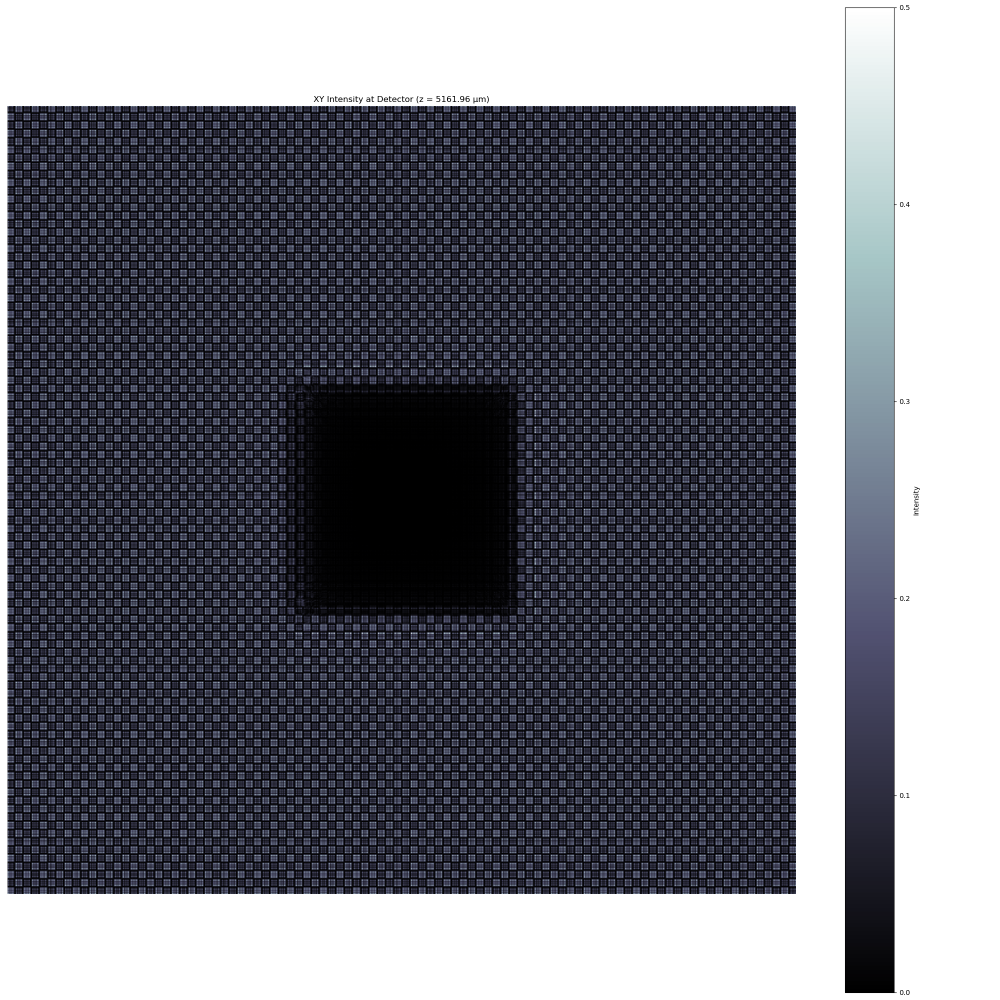

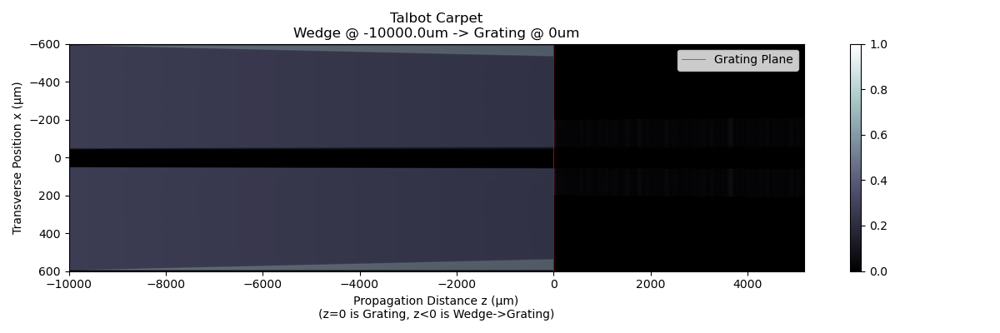

In [58]:
# --- Plotting ---
x_padded = x_cpu
x_crop = x_padded
 
intensity_slice = intensity_carpet_slice.transpose()
 
x_plot_um = x_crop * 1e-3
z_plot_um = z * 1e-3
 
filename = f"talbot_2d_{order}_zT"
if use_spherical:
    filename += "_spherical"
else:
    filename += "_plane"
if use_wedge:
    filename += "_wedge"
if use_only_phase:
    filename += "_no_abs"
 
plt.figure(figsize=(12, 4))
 
# Split the data into two parts based on the known index of the grating
# idx_grating was defined as nz_gap earlier
intensity_gap = intensity_slice[:, :idx_grating]
intensity_main = intensity_slice[:, idx_grating:]
 
# Define physical extents for both parts
# Extent format: [left, right, bottom, top]
# Note: x_max is bottom, x_min is top to match array row order (top-down)
 
# Part 1: Wedge to Grating (z < 0)
extent_gap = [z_plot_um[0], 0, x_plot_um.max(), x_plot_um.min()]
 
# Part 2: Grating to Detector (z > 0)
extent_main = [0, z_plot_um[-1], x_plot_um.max(), x_plot_um.min()]
 
# Plot Part 1
plt.imshow(
    intensity_gap,
    extent=extent_gap,
    aspect='auto',
    cmap='bone'
)
 
# Plot Part 2
plt.imshow(
    intensity_main,
    extent=extent_main,
    aspect='auto',
    cmap='bone'
)
 
plt.axis('on')
plt.xlim(z_plot_um[0], z_plot_um[-1]) # Explicitly set x-limits to show both parts
# plt.ylim(-Lx/2*1e-3 - 2*dx * 1e-3,Lx/2*1e-3 + 2*dx * 1e-3)
plt.xlabel("Propagation Distance z (µm)\n(z=0 is Grating, z<0 is Wedge->Grating)")
plt.ylabel("Transverse Position x (µm)")
plt.clim(0, 1)
 
title_str = f"Talbot Carpet\n"
if use_wedge:
    title_str += f"Wedge @ {z_gap[0]/1e9*1e6:.1f}um -> "
title_str += f"Grating @ 0um"
plt.title(title_str)
 
plt.axvline(0, color='r', linestyle='-', linewidth=0.5, label="Grating Plane")
# Optional: Mark Talbot distances
# plt.axvline(zT/4.0 * 1e-3, color='c', linestyle='--', label=f"1/4 zT")
 
plt.legend()
plt.tight_layout()
plt.colorbar()
# plt.savefig(filename + "_carpet.png")
 
plt.figure(figsize=(20, 20), dpi=100, frameon=False)
plt.imshow(
    final_intensity_2d,
    extent=[x_plot_um.min(), x_plot_um.max(), x_plot_um.min(), x_plot_um.max()],
    origin='lower',
    cmap='bone'
)
plt.xlim(-Lx/2*1e-3 - 2*dx * 1e-3,Lx/2*1e-3 + 2*dx * 1e-3)
plt.ylim(-Lx/2*1e-3 - 2*dy * 1e-3,Lx/2*1e-3 + 2*dy * 1e-3)
plt.clim(0, 0.5)
plt.axis('off')
 
plt.tight_layout()
plt.savefig(filename + "_pattern.tif", bbox_inches='tight', pad_inches=0)
plt.colorbar(label="Intensity")
plt.title(f"XY Intensity at Detector (z = {z_max/1000:.2f} µm)")
plt.xlabel("x (µm)")
plt.ylabel("y (µm)")
 
plt.savefig(filename + "_pattern.png")
 
print("Plots saved.")
plt.show()

In [59]:
# 1. Define the exact physical limits used in your plt.xlim and plt.ylim
x_min_target = -Lx/2 * 1e-3 - 2*dx * 1e-3
x_max_target =  Lx/2 * 1e-3 + 2*dx * 1e-3
y_min_target = -Lx/2 * 1e-3 - 2*dy * 1e-3
y_max_target =  Lx/2 * 1e-3 + 2*dy * 1e-3

# 2. Find the corresponding array indices using your coordinate array
# (Assuming x_plot_um is a 1D array representing the coordinates)
x_mask = (x_plot_um >= x_min_target) & (x_plot_um <= x_max_target)
y_mask = (x_plot_um >= y_min_target) & (x_plot_um <= y_max_target)

x_indices = np.where(x_mask)[0]
y_indices = np.where(y_mask)[0]

# Extract the start and end indices
ix_min, ix_max = x_indices[0], x_indices[-1]
iy_min, iy_max = y_indices[0], y_indices[-1]

# 3. Crop the 2D array
# Note: Numpy arrays are indexed as [rows(y), columns(x)]
cropped_intensity = final_intensity_2d[iy_min:iy_max+1, ix_min:ix_max+1]

# 4. Save to a .npy file
save_path = filename + ".npy"
np.save(save_path, cropped_intensity)

print(f"Cropped array of shape {cropped_intensity.shape} saved to {save_path}.")

Cropped array of shape (2052, 2052) saved to talbot_2d_2_zT_spherical_wedge.npy.
